# ***Start***


In [1]:
!pip install transformers

In [2]:
import json
from pathlib import Path
import torch
from torch.utils.data import DataLoader
import time
import numpy as np
import pandas as pd
import json
import math
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [3]:
# Save model
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## ***Step 1:*** Download CoQA dataset and Tranformers library

In [4]:
%%capture
!git clone https://github.com/Ele975/AML_project2.git


In [5]:
%%capture
from transformers import AutoTokenizer,BertTokenizerFast
from urllib.request import urlopen

## ***Step 2:*** Retrieve and Store the data

In [6]:
##get the coqa validation data set from the website
jsonurl = urlopen("https://downloads.cs.stanford.edu/nlp/data/coqa/coqa-dev-v1.0.json")
val = json.loads(jsonurl.read())
val

{'version': '1.0',
 'data': [{'source': 'mctest',
   'id': '3dr23u6we5exclen4th8uq9rb42tel',
   'filename': 'mc160.test.41',
   'story': 'Once upon a time, in a barn near a farm house, there lived a little white kitten named Cotton. Cotton lived high up in a nice warm place above the barn where all of the farmer\'s horses slept. But Cotton wasn\'t alone in her little home above the barn, oh no. She shared her hay bed with her mommy and 5 other sisters. All of her sisters were cute and fluffy, like Cotton. But she was the only white one in the bunch. The rest of her sisters were all orange with beautiful white tiger stripes like Cotton\'s mommy. Being different made Cotton quite sad. She often wished she looked like the rest of her family. So one day, when Cotton found a can of the old farmer\'s orange paint, she used it to paint herself like them. When her mommy and sisters found her they started laughing. \n\n"What are you doing, Cotton?!" \n\n"I only wanted to be more like you". \n\n

In [7]:
##get the coqa training data set from the website
jsonurl = urlopen("https://nlp.stanford.edu/data/coqa/coqa-train-v1.0.json")
train = json.loads(jsonurl.read())
train

{'version': '1.0',
 'data': [{'source': 'wikipedia',
   'id': '3zotghdk5ibi9cex97fepx7jetpso7',
   'filename': 'Vatican_Library.txt',
   'story': 'The Vatican Apostolic Library (), more commonly called the Vatican Library or simply the Vat, is the library of the Holy See, located in Vatican City. Formally established in 1475, although it is much older, it is one of the oldest libraries in the world and contains one of the most significant collections of historical texts. It has 75,000 codices from throughout history, as well as 1.1 million printed books, which include some 8,500 incunabula. \n\nThe Vatican Library is a research library for history, law, philosophy, science and theology. The Vatican Library is open to anyone who can document their qualifications and research needs. Photocopies for private study of pages from books published between 1801 and 1990 can be requested in person or by mail. \n\nIn March 2014, the Vatican Library began an initial four-year project of digitising

## Dataset Cleaning, Preparation, Analysis

Here I take and store the texts, queries and answers from the train and validation .json files. If we look carefully we will see that in these files there are a number of queries and answers for each passage. I save these informations into lists.

In [43]:
#through this i want to separate the question and answer text

def input_vocabulary(series):
  indexs = [0]
  questionsList = []
  answersList = []
  contextList = []
  answer_startList = []
  answer_EndList = []


  for i, category in enumerate(series):

      for question in category["questions"]:
        contextList.append(category["story"])
        question = question["input_text"].lower()
        # remove punctuation, split '/' and numbers and words with numbers
        clean_question = re.sub(r'[^\w\s/]', '', question)
        clean_question = re.sub(r'/', ' ', clean_question)
        clean_question = re.sub(r'\b(?:\w*\d\w*|\d+)\b', '', clean_question)
        clean_question = re.sub(r'_', '', clean_question)

      for answer in category["answers"]:
        if answer == " ":
            text = None
            answersList.append(text)
            questionsList.append(text)
        else:
          answersList.append(answer["input_text"])
          questionsList.append(clean_question)
          answer_startList.append(answer["span_start"])
          answer_EndList.append(answer["span_end"])
          #print()
      indexs.append(indexs[-1] + len(category["questions"]))
  return questionsList, answersList, contextList, answer_startList, answer_EndList

questionsTrainList, answersTrainList, contextTrainList, answersStartTrain, answer_EndTrain = input_vocabulary(train['data'])
questionsValList, answersValList, contextValList, answersStartVal, answer_EndVal = input_vocabulary(val['data'])

## ***Step 3:*** Check the data

In [9]:
def count_data(series):
  nr_categories = 0
  nr_questions = 0
  nr_answers = 0

  for i, category in enumerate(series):
    contextTrainList.append(category["story"])
    nr_categories += 1
    for question in category["questions"]:
      nr_questions += 1
    for answer in category["answers"]:
       nr_answers += 1
  return nr_categories, nr_questions, nr_answers

count_train = count_data(train['data'])
count_val = count_data(val['data']);

print("Categories in the training set:", count_train[0])
print("Categories in the validation set:", count_val[0], "\n")
print("Questions in the training set:", count_train[1])
print("Questions in the validation set:", count_val[1], "\n")
print("Answers in the training set:", count_train[2])
print("Answers in the validation set:", count_val[2], "\n")

print('Total data in training set (Q + A):', count_train[1] + count_train[2])
print('Total data in validation set (Q + A):', count_val[1] + count_val[2], "\n")

print('Total data in dataset (Q + A):', count_train[1] + count_train[2] + count_val[1] + count_val[2], "\n")

print('Partition dataset:')
print('\t Training set:',round((count_train[1] + count_train[2])/(count_train[1] + count_train[2] + count_val[1] + count_val[2])*100) , '%.')
print('\t Validation set:',round((count_val[1] + count_val[2])/(count_train[1] + count_train[2] + count_val[1] + count_val[2])*100) , '%.')


Categories in the training set: 7199
Categories in the validation set: 500 

Questions in the training set: 108647
Questions in the validation set: 7983 

Answers in the training set: 108647
Answers in the validation set: 7983 

Total data in training set (Q + A): 217294
Total data in validation set (Q + A): 15966 

Total data in dataset (Q + A): 233260 

Partition dataset:
	 Training set: 93 %.
	 Validation set: 7 %.


As you can see we have 86821 passages, queries and answers from the training data. The answer is stored in a dictionary with the specific answer in the "text" cell and the accurate character index that the answer is started in cell "answer start". As we observe, is missing the information about the exact index of the character that the answer is ending.

In [10]:

##checking that they are all the same lengths so that there is no issue with tokenising
print(f"{len(questionsTrainList)}")
print(f"{len(answersTrainList)}")
print(f"{len(contextTrainList)}")
print(f"{len(answersStartTrain)}")

print("\n")

print(f"{questionsTrainList[len(questionsTrainList)-1]}")
print(f"{answersTrainList[len(answersTrainList)-1]}")
print(f"{contextTrainList[len(contextTrainList)-1]}")

108647
108647
116346
108647


by how much
six points
Las Vegas (, Spanish for "The Meadows"), officially the City of Las Vegas and often known simply as Vegas, is the 28th-most populated city in the United States, the most populated city in the state of Nevada, and the county seat of Clark County. The city anchors the Las Vegas Valley metropolitan area and is the largest city within the greater Mojave Desert. Las Vegas is an internationally renowned major resort city, known primarily for its gambling, shopping, fine dining, entertainment, and nightlife. The Las Vegas Valley as a whole serves as the leading financial, commercial, and cultural center for Nevada. 

The city bills itself as The Entertainment Capital of the World, and is famous for its mega casino–hotels and associated activities. It is a top three destination in the United States for business conventions and a global leader in the hospitality industry, claiming more AAA Five Diamond hotels than any other city in the world.

checking its the same for validation as well

In [11]:
##checking that they are all the same lengths so that there is no issue with tokenising
print(f"{len(questionsValList)}")
print(f"{len(answersValList)}")
print(f"{len(contextValList)}")

7983
7983
7983


This was helped me to split my dataset in order to run my notebook in my first attemps.

In [12]:
train_texts = contextValList[:10]
train_queries = questionsValList[:10]
train_answers = answersValList[:10]
train_start = answersStartTrain[:10]
train_end = answer_EndTrain[:10]

val_texts = contextValList[:10]
val_queries = questionsValList[:10]
val_answers = answersValList[:10]
val_start = answersStartVal[:10]
val_end = answer_EndVal[:10]

In [13]:
train_answers
train_texts[0]

'Once upon a time, in a barn near a farm house, there lived a little white kitten named Cotton. Cotton lived high up in a nice warm place above the barn where all of the farmer\'s horses slept. But Cotton wasn\'t alone in her little home above the barn, oh no. She shared her hay bed with her mommy and 5 other sisters. All of her sisters were cute and fluffy, like Cotton. But she was the only white one in the bunch. The rest of her sisters were all orange with beautiful white tiger stripes like Cotton\'s mommy. Being different made Cotton quite sad. She often wished she looked like the rest of her family. So one day, when Cotton found a can of the old farmer\'s orange paint, she used it to paint herself like them. When her mommy and sisters found her they started laughing. \n\n"What are you doing, Cotton?!" \n\n"I only wanted to be more like you". \n\nCotton\'s mommy rubbed her face on Cotton\'s and said "Oh Cotton, but your fur is so pretty and special, like you. We would never want yo

In [14]:
train_start

[151, 454, 457, 457, 769, 1048, 1048, 4, 94, 328]

In [15]:
# print(len(train_texts))
# print(len(train_queries))
# print(len(train_answers))

In [16]:
# print(len(val_texts))
# print(len(val_queries))
# print(len(val_answers))

## ***Step 4:*** Find the end position character

Because Bert model needs both start and end position characters of the answer, I have to find it and store it for later. Sometimes, I notice that SQuAD anwers "eat" one or two characters from the real answer in the passage. For example, for the word "sixth" in passage, SQuAD give the answer of "six". So in these cases I select to handle this problem by "cutting" the passage by 1 or 2 characters to be the same as the given answer. This strategy is because BERT works with ***tokens*** of a specific format so I needed to process the squad dataset to keep up with the input that BERT is waiting for.

Find end position character in train data

In [17]:
for answer, text, start, end  in zip(train_answers, train_texts, train_start, train_end):
    real_answer = answer
    start_idx = start
    # Get the real end index
    end_idx = end

    # Deal with the problem of 1 or 2 more characters
    if text[start_idx:end_idx] == real_answer:
        answer['answer_end'] = end_idx
    # When the real answer is more by one character
    elif text[start_idx-1:end_idx-1] == real_answer:
        answer['answer_start'] = start_idx - 1
        answer['answer_end'] = end_idx - 1
    # When the real answer is more by two characters
    elif text[start_idx-2:end_idx-2] == real_answer:
        answer['answer_start'] = start_idx - 2
        answer['answer_end'] = end_idx - 2

Find end position character in validation data

In [46]:
for answer, text, start, end in zip(val_answers, val_texts, val_start, val_end):
    real_answer = answer
    start_idx = start
    # Get the real end index
    end_idx = end
    print(real_answer)
    print(text[start_idx:end_idx])

    # Deal with the problem of 1 or 2 more characters
    if text[start_idx:end_idx] == real_answer:
        answer['answer_end'] = end_idx
        print(answer)
    # When the real answer is more by one character
    elif text[start_idx-1:end_idx-1] == real_answer:
        answer['answer_start'] = start_idx - 1
        answer['answer_end'] = end_idx - 1
        print(answer)
    # When the real answer is more by two characters
    elif text[start_idx-2:end_idx-2] == real_answer:
        answer['answer_start'] = start_idx - 2
        answer['answer_end'] = end_idx - 2
        print(answer)

white
a little white kitten named Cotton
in a barn
in a barn near a farm house, there lived a little white kitten
no
Cotton wasn't alone
with her mommy and 5 sisters
with her mommy and 5 other sisters
orange and white
her sisters were all orange with beautiful white tiger stripes
no
Being different made Cotton quite sad
she painted herself
she used it to paint herself like them
the farmer
the old farmer's orange paint
they started laughing
When her mommy and sisters found her they started laughing
a bucket of water
mommy picked her up and dropped her into a big bucket of water


## ***Step 5:*** Tokenize passages and queries

In this task is asked to select the BERT-base pretrained model “bert-base-uncased” for the tokenization

In [19]:
from transformers import AutoTokenizer,AdamW,BertForQuestionAnswering
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

train_encodings = tokenizer(train_texts, train_queries, truncation=True, padding=True)
val_encodings = tokenizer(val_texts, val_queries, truncation=True, padding=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

## ***Step 6:*** Convert the start-end positions to tokens start-end positions

In [29]:
def add_token_positions(encodings, answers, start, end):
  start_positions = []
  end_positions = []

  count = 0

  for i in range(len(answers)):
    start_positions.append(encodings.char_to_token(i, start[i]))
    end_positions.append(encodings.char_to_token(i, end[i]))

    # if start position is None, the answer passage has been truncated
    if start_positions[-1] is None:
      start_positions[-1] = tokenizer.model_max_length

    # if end position is None, the 'char_to_token' function points to the space after the correct token, so add - 1
    if end_positions[-1] is None:
      end_positions[-1] = encodings.char_to_token(i, end[i] - 1)
      # if end position is still None the answer passage has been truncated
      if end_positions[-1] is None:
        count += 1
        end_positions[-1] = tokenizer.model_max_length

  print(count)

  # Update the data in dictionary
  encodings.update({'start_positions': start_positions, 'end_positions': end_positions})


#start_positions.append(encodings.char_to_token(i, answers[0][start[0]]))
add_token_positions(train_encodings, train_answers, train_start, train_end )
add_token_positions(val_encodings, val_answers, val_start, val_end)

0
0


I observed that after tokenize the end position character, sometimes was still None. This happended only for 10 answers in train data (of total 86821) and 16 answers in validation data (of total 20302). So I decided to move the answer 1 position left. If it was still None then I give them the model_max_length as before. I have to refer that I was trying to see if the answers in this case was 1 postition after (so I added +1 to the end position) or 2 positions left or right (+/- 2 positions), but the answers that there are still None was more (ie 526, while with this code there only 10). So I kept this strategy in the end, in order to have as less as possible "burned" answers.

## ***Step 7:*** Create a Dataset class

Create a Squatdataset class (inherits from torch.utils.data.Dataset), that helped me to train and validate my previous data more easily and convert encodings to datasets.

In [32]:
class Dataset(torch.utils.data.Dataset):
    def __init__(self, encodings):
        self.encodings = encodings

    def __getitem__(self, idx):
        return {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}

    def __len__(self):
        return len(self.encodings.input_ids)

In [33]:
train_dataset = Dataset(train_encodings)
val_dataset = Dataset(val_encodings)

## ***Step 8:*** Use of DataLoader

I put my previous data to DataLoader, so as to split them in "pieces" of 8 batch size. I will explain the selection of this value of batch size later.

In [34]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)

## ***Step 9:*** Use GPU

In [35]:
device = torch.device('cuda:0' if torch.cuda.is_available()
                      else 'cpu')

## ***Step 10:*** Build the Bert model

I select BertForQuestionAnswering from transformers library, as it was the most relative with this task. When we instantiate a model with from_pretrained(), the model configuration and pre-trained weights of the specified model are used to initialize the model. Moreover, I used the PyTorch optimizer of AdamW which implements gradient bias correction as well as weight decay.



In [36]:
model = BertForQuestionAnswering.from_pretrained('bert-base-uncased').to(device)

optim = AdamW(model.parameters(), lr=5e-5)
# optim = AdamW(model.parameters(), lr=3e-5)
# optim = AdamW(model.parameters(), lr=2e-5)

# epochs = 2
epochs = 3
# epochs = 4

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


This message is a warning that I should fine tune my model before I test it, in order to have a good performance.

## ***Step 11:*** Train and Evaluate Model

Training of model

In [37]:
whole_train_eval_time = time.time()

train_losses = []
val_losses = []

print_every = 1000

for epoch in range(epochs):
  epoch_time = time.time()

  # Set model in train mode
  model.train()

  loss_of_epoch = 0

  print("############Train############")

  for batch_idx,batch in enumerate(train_loader):

    optim.zero_grad()

    input_ids = batch['input_ids'].to(device)
    attention_mask = batch['attention_mask'].to(device)
    start_positions = batch['start_positions'].to(device)
    end_positions = batch['end_positions'].to(device)

    outputs = model(input_ids, attention_mask=attention_mask, start_positions=start_positions, end_positions=end_positions)
    loss = outputs[0]
    # do a backwards pass
    loss.backward()
    # update the weights
    optim.step()
    # Find the total loss
    loss_of_epoch += loss.item()

    if (batch_idx+1) % print_every == 0:
      print("Batch {:} / {:}".format(batch_idx+1,len(train_loader)),"\nLoss:", round(loss.item(),1),"\n")

  loss_of_epoch /= len(train_loader)
  train_losses.append(loss_of_epoch)

  ##########Evaluation##################

  # Set model in evaluation mode
  model.eval()

  print("############Evaluate############")

  loss_of_epoch = 0

  for batch_idx,batch in enumerate(val_loader):

    with torch.no_grad():

      input_ids = batch['input_ids'].to(device)
      attention_mask = batch['attention_mask'].to(device)
      start_positions = batch['start_positions'].to(device)
      end_positions = batch['end_positions'].to(device)

      outputs = model(input_ids, attention_mask=attention_mask, start_positions=start_positions, end_positions=end_positions)
      loss = outputs[0]
      # Find the total loss
      loss_of_epoch += loss.item()

    if (batch_idx+1) % print_every == 0:
       print("Batch {:} / {:}".format(batch_idx+1,len(val_loader)),"\nLoss:", round(loss.item(),1),"\n")

  loss_of_epoch /= len(val_loader)
  val_losses.append(loss_of_epoch)

  # Print each epoch's time and train/val loss
  print("\n-------Epoch ", epoch+1,
        "-------"
        "\nTraining Loss:", train_losses[-1],
        "\nValidation Loss:", val_losses[-1],
        "\nTime: ",(time.time() - epoch_time),
        "\n-----------------------",
        "\n\n")

print("Total training and evaluation time: ", (time.time() - whole_train_eval_time))

############Train############
############Evaluate############

-------Epoch  1 -------
Training Loss: 5.780052661895752 
Validation Loss: 5.981500625610352 
Time:  71.40043139457703 
----------------------- 


############Train############
############Evaluate############

-------Epoch  2 -------
Training Loss: 5.112020015716553 
Validation Loss: 5.781051158905029 
Time:  58.194048166275024 
----------------------- 


############Train############
############Evaluate############

-------Epoch  3 -------
Training Loss: 4.389627456665039 
Validation Loss: 6.076727390289307 
Time:  56.37911343574524 
----------------------- 


Total training and evaluation time:  185.98901915550232


In [38]:
# Save model
from google.colab import drive
drive.mount('/content/drive')

torch.save(model,"/content/drive/MyDrive/finetunedmodelCoQA")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## ***Step 12:*** Plot train and validation losses

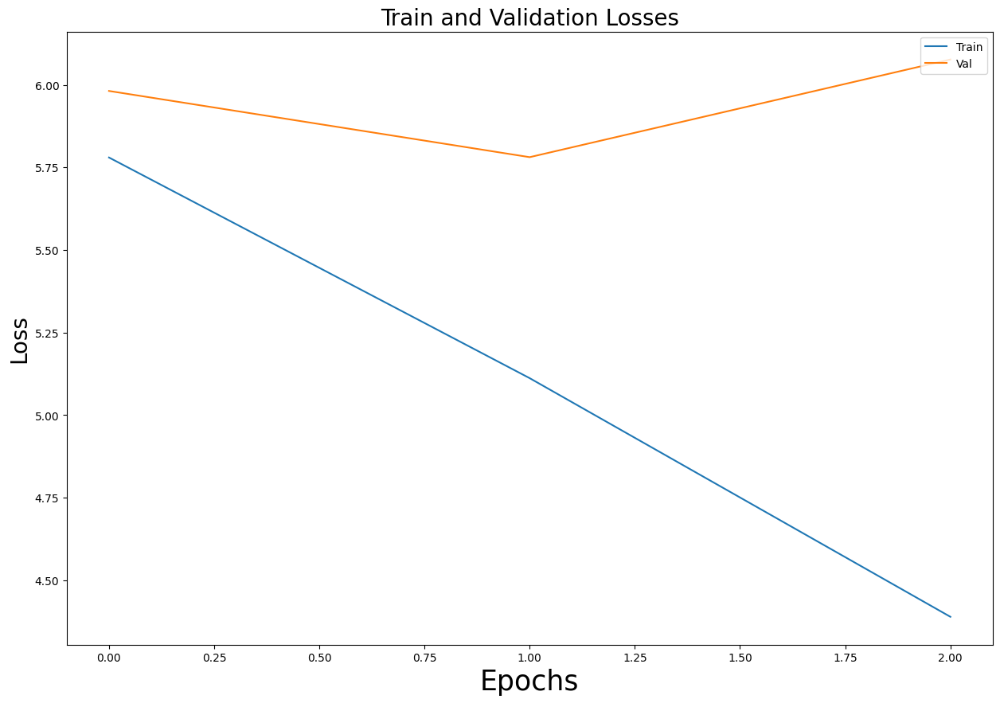

In [39]:
import matplotlib.pyplot as plt

fig,ax = plt.subplots(1,1,figsize=(15,10))

ax.set_title("Train and Validation Losses",size=20)
ax.set_ylabel('Loss', fontsize = 20)
ax.set_xlabel('Epochs', fontsize = 25)
_=ax.plot(train_losses)
_=ax.plot(val_losses)
_=ax.legend(('Train','Val'),loc='upper right')

## ***Step 13:*** Load the fine tuned model

In [41]:
from google.colab import drive
drive.mount('/content/drive')
# Define the bert tokenizer
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')

# Load the fine-tuned modeol
model = torch.load("/content/drive/MyDrive/finetunedmodelCoQA",map_location=torch.device('cpu'))

model.eval()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


BertForQuestionAnswering(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elem

## ***Step 14:*** Make the prediction and evaluate it